# t-SNE Heatmaps

- [Comprehensive Guide on t-SNE algorithm with implementation in R & Python](https://www.analyticsvidhya.com/blog/2017/01/t-sne-implementation-r-python/)
- [Multicore t-SNE](https://github.com/sg-s/Multicore-TSNE#installation-macos-specific)
- [Accelerating t-SNE using Tree-Based Algorithms](http://lvdmaaten.github.io/publications/papers/JMLR_2014.pdf)

## Possible follow-ups

1. Test if effective for between group comparisons
2. Better algorithms for searching for differential expression on the plane
3. Add a clustering step to isolate cell-subsets that differ
4. Develop interactive visualization using `dash` or other package

In [1]:
%load_ext rpy2.ipython

In [2]:
%matplotlib inline
import matplotlib.pyplot as plt

In [3]:
from MulticoreTSNE import MulticoreTSNE as TSNE
from sklearn.preprocessing import StandardScaler
from sklearn.datasets import make_blobs
from sklearn import manifold

In [4]:
import os
import matplotlib
import numpy as np
import pandas as pd
from matplotlib.path import  Path
import matplotlib.patches as patches
np.set_printoptions(formatter={'all': lambda x: '%.3f' % x})

## Comparsion of counts for AMJ from EQAPOL normal under costim, SEB and CMV-pp65

In [5]:
data_dir = '/Users/cliburn/_learn/mpk/data/EQAPOL_normal/'

In [6]:
x0 = pd.read_csv(os.path.join(data_dir, 'AMJ_5L_Costim_clean.csv'))
x1 = pd.read_csv(os.path.join(data_dir, 'AMJ_5L_CMVpp65_clean.csv'))
x2 = pd.read_csv(os.path.join(data_dir, 'AMJ_5L_SEB_clean.csv'))

In [7]:
np.random.seed(123)
n = 10000
y0 = x0.sample(n, replace=False)
y1 = x1.sample(n, replace=False)
y2 = x2.sample(n, replace=False)
y = pd.concat([y0, y1, y2])

In [8]:
y.columns

Index(['FSC-A', 'FSC-H', 'FSC-W', 'SSC-A', 'SSC-H', 'SSC-W', 'CD57 FITC',
       'CD4 PerCP Cy55', 'CD14 CD19 vAmine', 'CD3 AmCyan', 'CD27 APC',
       'TNFa A700', 'CD8 APC Cy7', 'IL 2 PE', 'CD45RO ECD', 'CD107 PE Cy5',
       'IFNg PE Cy7', 'Time'],
      dtype='object')

In [9]:
y = y.loc[:, ['FSC-A', 'SSC-A', 'CD57 FITC',
              'CD4 PerCP Cy55', 'CD14 CD19 vAmine', 
              'CD3 AmCyan', 'CD27 APC', 'TNFa A700', 
              'CD8 APC Cy7', 'IL 2 PE', 'CD45RO ECD', 
              'CD107 PE Cy5', 'IFNg PE Cy7']]

In [10]:
scaler = StandardScaler()

In [11]:
ys = scaler.fit_transform(y)

In [12]:
# tsne = TSNE(n_jobs=24, init='pca')
tsne = manifold.TSNE(n_components=2, init='pca', random_state=0)

In [13]:
try:
    fail
    ty = np.load('ty.npy')
except Exception:
    ty = tsne.fit_transform(ys)
    np.save('ty.npy', ty)

In [14]:
cmap = matplotlib.colors.ListedColormap(['blue', 'green', 'red'])

In [15]:
z = np.r_[np.zeros(n), np.ones(n), 2*np.ones(n)]

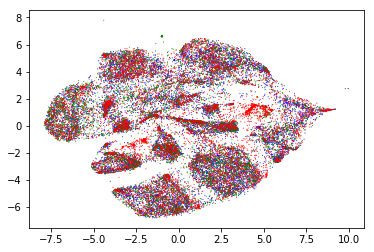

In [16]:
plt.scatter(ty[:, 0], ty[:, 1], s=1, c=z, edgecolors='none', cmap=cmap)
pass

### Costim

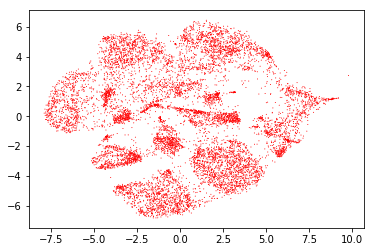

In [17]:
plt.scatter(ty[:n, 0], ty[:n, 1], c='red', s=1, edgecolors='none')
pass

### SEB

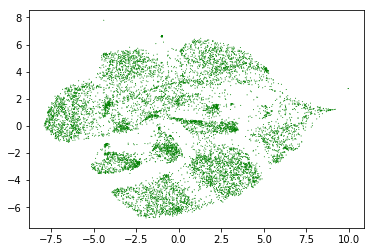

In [18]:
plt.scatter(ty[n:2*n, 0], ty[n:2*n, 1], c='green', s=1, edgecolors='none')
pass

### CMV pp65

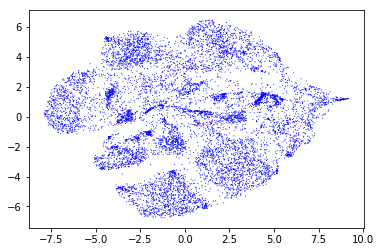

In [19]:
plt.scatter(ty[2*n:3*n, 0], ty[2*n:3*n, 1], c='blue', s=1, edgecolors='none')
pass

## Grid analysis

In [20]:
import scipy.stats as stats
from collections import Counter
from statsmodels.sandbox.stats.multicomp import multipletests as adjust_p

### Significance tests

Note that almost any statistical test can be done, since all we are doing is comparing counts from different cells. Since we are dealing with counts, a $\chi^2$ test or equivalent will probably be suitable for most comparisons.

In [21]:
def c2p(obs):
    exp = np.mean(obs) * np.ones(len(obs))
    chi2 = ((obs - exp)**2/exp).sum()
    return(1 - stats.chi2.cdf(x=chi2, df=len(obs)-1))

In [22]:
k = 21
xmin, ymin = ty.min(axis=0)
xmax, ymax = ty.max(axis=0)
xspan = np.linspace(xmin, xmax, k)
yspan = np.linspace(ymin, ymax, k)

In [23]:
keys = np.unique(z)
ps = np.zeros((k-1, k-1))
observed = {}
paths = {}

for i in range(k-1):
    for j in range(k-1):
        xverts = [xspan[i], xspan[i], xspan[i+1], xspan[i+1]]
        yverts = [yspan[j+1], yspan[j], yspan[j], yspan[j+1]]
        p = Path(np.c_[xverts, yverts])
        paths[i,j] = p
        points = p.contains_points(ty)
        counts = z[points]
        c = Counter(counts)
        obs = np.array([c.get(key, 0) for key in keys])
        if sum(obs) > 10:
            ps[i,j] = c2p(obs)
        else:
            ps[i,j] = 1.0
        observed[(i,j)] = obs

In [24]:
ps_ = ps.ravel()

In [25]:
%%R -i ps_ -o padj

padj <- p.adjust(ps_, method="BH")

In [26]:
padj = padj.reshape(ps.shape)

In [27]:
threshold = 0.05

## Plot interesting regions on t-SNE projection

Would be nice if this was an interactive plot, so that hovering over each patch shows summary information (counts for each data set, adjusted p-value) and parallel coordinates plots for each sample (or group).

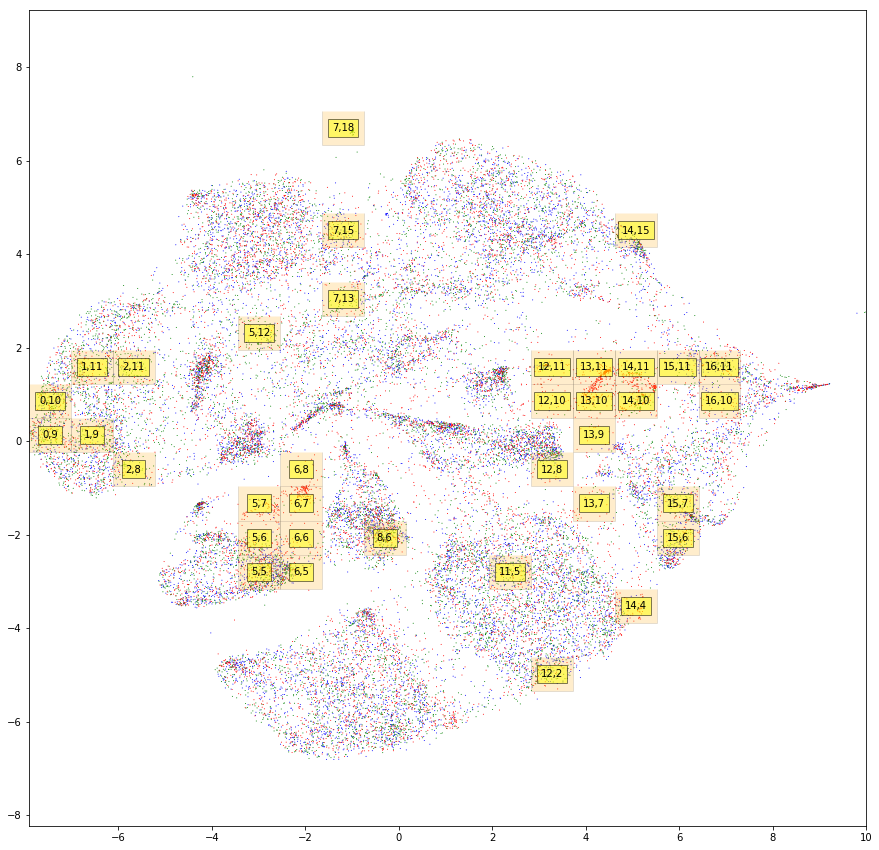

In [28]:
fig, ax = plt.subplots(figsize=(15,15))
ax.axis('equal')
# ax.pcolor(xspan, yspan, padj.T, vmin=0, vmax=1, cmap="Reds_r", alpha=0.2)

sigs =[]
for i in range(k-1):
    for j in range(k-1):
        xverts = [xspan[i], xspan[i], xspan[i+1], xspan[i+1]]
        yverts = [yspan[j+1], yspan[j], yspan[j], yspan[j+1]]
        p = Path(np.c_[xverts, yverts])
        if padj[i, j] < threshold:
            sigs.append((i,j))
            patch = patches.PathPatch(p, facecolor='orange', lw=0.5, alpha=0.2)
            ax.add_patch(patch)
            xcenter = (xverts[0] + xverts[2])/2.0
            ycenter = (yverts[0] + yverts[1])/2.0
            ax.text(xcenter, ycenter, '%d,%d' % (i,j), ha='center', va='center',
                   bbox=dict(facecolor='yellow', alpha=0.5))

ax.scatter(ty[:, 0], ty[:, 1], s=1, c=z, edgecolors='none', cmap=cmap)
ax.set_xlim([xmin, xmax])
ax.set_ylim([ymin, ymax])
pass

## Plotting gates by greedy algorithm

In [29]:
import seaborn as sns

In [30]:
sns.set_context('notebook', font_scale=1.5)

In [31]:
titles = ['NEG', 'CMV', 'SEB']

In [32]:
pv_idx = np.argsort(padj.ravel())

### Summarizing information for interesting regions

In [34]:
ax_min = y.min(axis=0)
ax_max = y.max(axis=0)

/usr/local/lib/python3.6/site-packages/ipykernel_launcher.py:18: RuntimeWarning: Mean of empty slice.
/usr/local/lib/python3.6/site-packages/numpy/core/_methods.py:73: RuntimeWarning: invalid value encountered in true_divide
  ret, rcount, out=ret, casting='unsafe', subok=False)
/usr/local/lib/python3.6/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


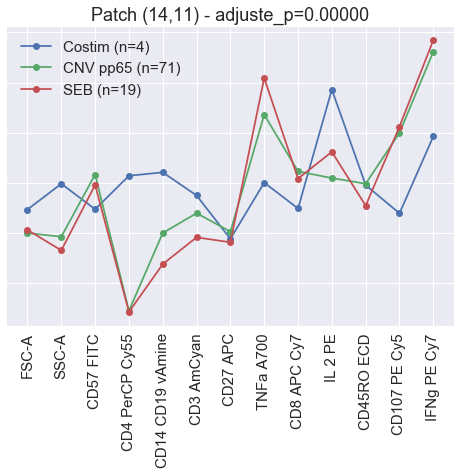

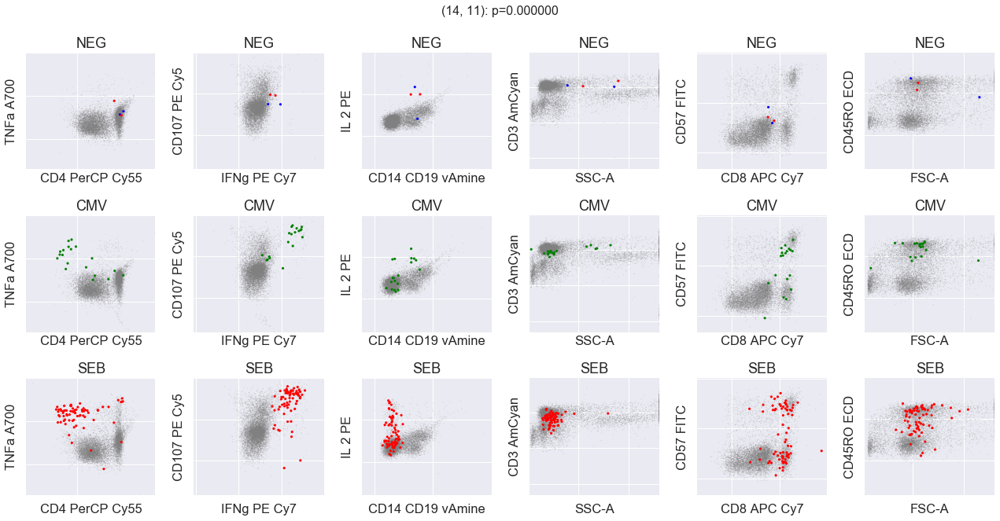

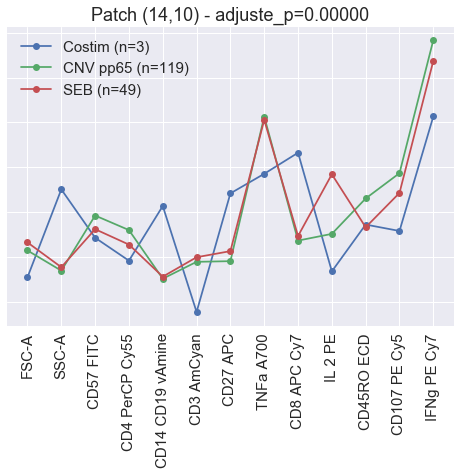

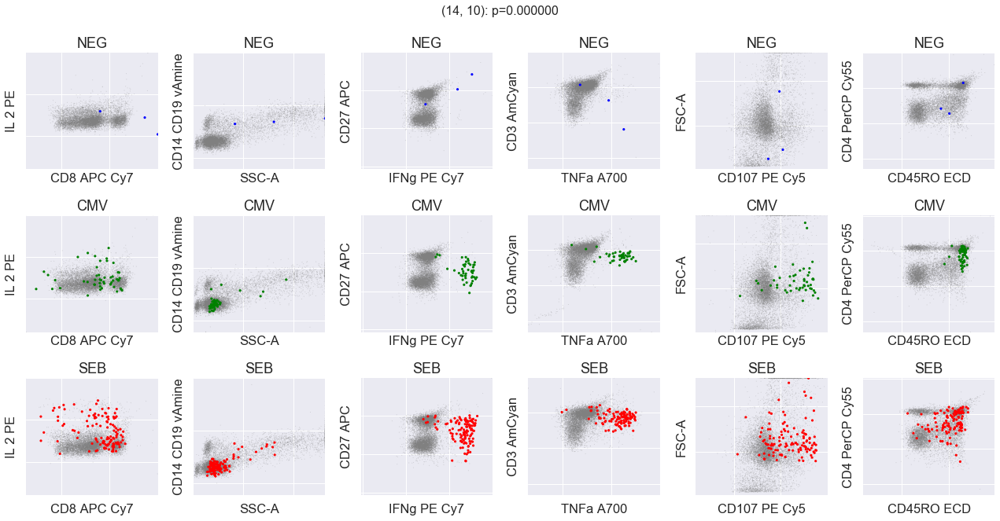

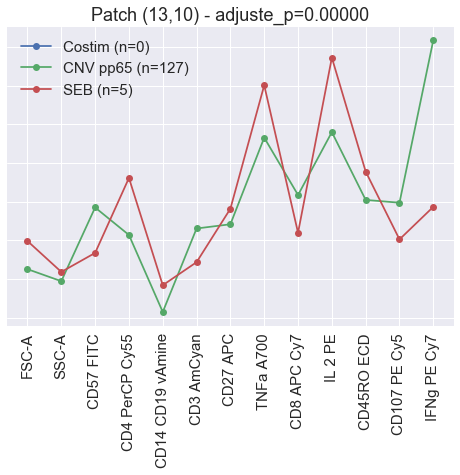

...

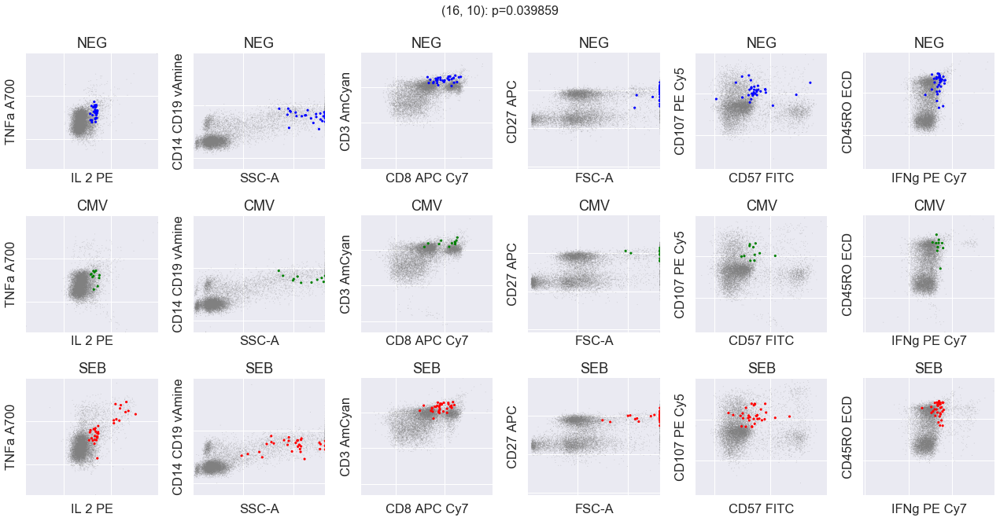

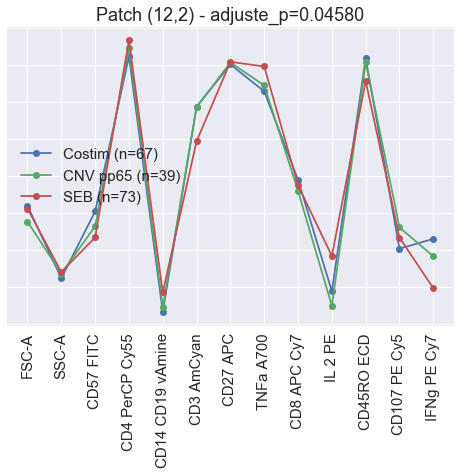

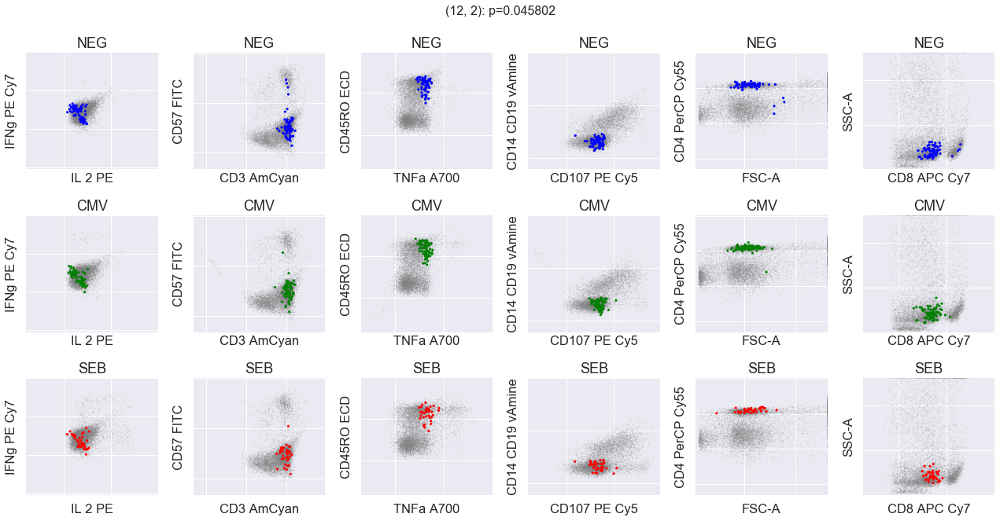

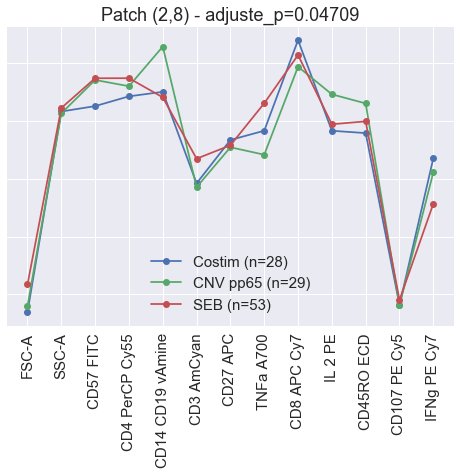

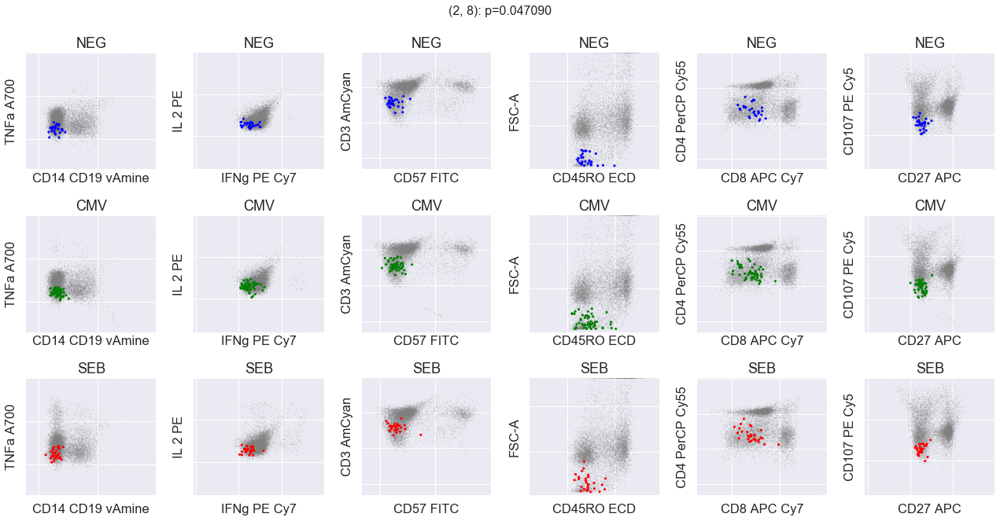

In [39]:
for k in range(len(pv_idx)):
    
    sig = divmod(pv_idx[k], padj.shape[1])
    obs = observed[sig]

    # Check that SEB > Costim or CMV > Cstim to detect activation related clusters
    if not ((obs[2] > obs[0]) or (obs[1] > obs[0])):
        continue
        
    # Ignore if not different among samples
    if padj[sig] > threshold:
        continue
    
    path = paths[sig]
    idx = path.contains_points(ty)
    y_path = y.iloc[idx,:]
    z_path = z[idx]
    mus = np.array([ys[idx, :][z_path==i].mean(axis=0) for i in np.unique(z)])

    xs = np.array([np.arange(len(mus[0])) for i in np.unique(z)])
    plt.figure()
    plt.plot(xs.T, mus.T, '-o')
    plt.xticks(xs[0], y.columns, rotation=90)
    plt.gca().set_yticklabels([])
    plt.title('Patch (%d,%d) - adjuste_p=%.5f' % (*sig, padj[sig]))
    plt.legend(['Costim (n=%d)' % obs[0], 'CNV pp65 (n=%d)' % obs[2], 'SEB (n=%d)' % obs[1]])
    
    sd = mus.std(axis=0)
    sidx = np.argsort(sd)
    cols = y.columns[sidx]
    
    rcols = cols[::-1]
    ncols = len(cols)//2
    nrows = 3

    fig, axes = plt.subplots(nrows, ncols, figsize=(3*ncols, 3*nrows),
                            sharex='col', sharey='col')
    for i in range(ncols):
        dim = rcols[2*i:2*i+2]
        fg = y_path.loc[:, dim].values
        bg = y.loc[:, dim].values
        for j in range(3):
            ax = axes[j, i]
            bg_idx = z==j
            fg_idx = z_path==j
            ax.scatter(bg[bg_idx, 0], bg[bg_idx, 1], s=1, c='grey', edgecolors='none', alpha=0.3)
            ax.scatter(fg[fg_idx, 0], fg[fg_idx, 1], s=10, c=cmap(j), edgecolors='none', cmap=cmap)

            ax.set_xticklabels([])
            ax.set_yticklabels([])
            ax.set_xlabel(rcols[2*i])
            ax.set_ylabel(rcols[2*i+1])
            ax.set_title(titles[j])
            ax.set_xlim([ax_min[dim[0]], ax_max[dim[0]]])
            ax.set_ylim([ax_min[dim[1]], ax_max[dim[1]]])

    fig.text(0.5, 1.02, '(%d, %d): p=%.6f' % (sig[0], sig[1], padj[sig]), va='center', ha='center', fontsize=16)
    plt.tight_layout()